## Importing Libraries

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import random
from skimage.feature import plot_matches
from scipy.ndimage import affine_transform
from scipy import ndimage
from google.colab.patches import cv2_imshow
np.set_printoptions(precision=4)

## Feature Extraction Functions

In [3]:
def gaussian_filter(input_image, sigma = 1):
  # padding the input image
  input_padded = np.pad(input_image, pad_width = 3*sigma, mode = 'reflect')

  # allocating memory for output image
  gaussian_filtered_image = np.zeros((input_image.shape[0], input_image.shape[1]))

  # allocating memory for gaussian filter
  gaussian_filter = np.zeros((6 * sigma + 1, 6 * sigma + 1))

  # storing the center pixel
  x_center = gaussian_filter.shape[0] // 2
  y_center = gaussian_filter.shape[1] // 2

  # adding values to the gaussian filter based on gaussian distribution
  for i in range(gaussian_filter.shape[0]):
    for j in range(gaussian_filter.shape[1]):
      x_coordinate = abs(j - y_center)
      y_coordinate = abs(i - x_center)

      term1 = 1 / (2 * np.pi * (sigma**2))
      term2 = np.exp((-x_coordinate**2 - y_coordinate**2) / (2 * sigma**2))
      gaussian_filter[j, i] = term1 * term2

  # normalizing the filter
  gaussian_filter = gaussian_filter/ np.sum(gaussian_filter)

  # performing convolution operation of gaussian filter on input image
  for i in range(input_padded.shape[0] - (gaussian_filter.shape[0] - 1)):
    for j in range(input_padded.shape[1] - (gaussian_filter.shape[1] - 1)):
      gaussian_filtered_image[i, j] = np.sum(input_padded[i: i + gaussian_filter.shape[0], j: j + gaussian_filter.shape[1]] * gaussian_filter)

  return gaussian_filtered_image

def partial_derivative(input_image):
  # defining sobel filters
  sobel_x = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
  sobel_y = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

  # allocating memory for gradients
  grad_x = np.zeros((input_image.shape[0], input_image.shape[1]))
  grad_y = np.zeros((input_image.shape[0], input_image.shape[1]))
  grad_xx = np.zeros((input_image.shape[0], input_image.shape[1]))
  grad_yy = np.zeros((input_image.shape[0], input_image.shape[1]))
  grad_xy = np.zeros((input_image.shape[0], input_image.shape[1]))

  # calculating derivative
  for i in range(input_image.shape[0] - (sobel_x.shape[0] - 1)):
    for j in range(input_image.shape[1] - (sobel_x.shape[1] - 1)):
      grad_x[i, j] = np.sum(input_image[i: i + sobel_x.shape[0], j: j + sobel_x.shape[1]] * sobel_x)
      grad_y[i, j] = np.sum(input_image[i: i + sobel_y.shape[0], j: j + sobel_y.shape[1]] * sobel_y)

  # calculating second derivatives for grad_xx and grad_yy
  for i in range(input_image.shape[0] - (sobel_x.shape[0] - 1)):
    for j in range(input_image.shape[1] - (sobel_y.shape[1]- 1)):
      grad_xx[i, j] = np.sum(grad_x[i: i + sobel_x.shape[0], j: j + sobel_x.shape[1]] * sobel_x)
      grad_yy[i, j] = np.sum(grad_y[i: i + sobel_y.shape[0], j: j + sobel_y.shape[1]] * sobel_y)
  # calculating second derivatives for grad_xy
  for i in range(grad_xy.shape[0] - (sobel_y.shape[0] - 1)):
    for j in range(grad_xy.shape[1] - (sobel_y.shape[1] - 1)):
      grad_xy[i, j] = np.sum(grad_x[i: i + sobel_y.shape[0], j: j + sobel_y.shape[1]] * sobel_y)

  return grad_xx, grad_yy, grad_xy, grad_x, grad_y

def corner_response(input_image):
  # Calculating first and second derivatives using partial derivative function
  grad_xx, grad_yy, grad_xy, grad_x, grad_y = partial_derivative(input_image)

  # specifying the window size
  window_size = 5
  threshold = 0.5
  alpha = 0.05
  corner_list = []

  for i in range(window_size, (input_image.shape[0]- window_size)):
    for j in range(window_size, (input_image.shape[1] - window_size)):
      xx = grad_xx[i-window_size: i+window_size+1, j-window_size:j+window_size+1].sum()
      yy = grad_yy[i-window_size: i+window_size+1, j-window_size:j+window_size+1].sum()
      xy = grad_xy[i-window_size: i+window_size+1, j-window_size:j+window_size+1].sum()

      term1 = (xx*yy) - (xy**2)
      term2 = (xx+yy)**2

      R = term1 - (alpha * term2)
      if R > threshold:
        corner_list.append([R,i,j])
  return corner_list

def corners(input_image):
    # computing corner response
  corner_list = corner_response(input_image)
  corner_list.sort(key = lambda x:x[0], reverse = True)
  sorted_clist = corner_list[:1000]

  corner_image = np.zeros((input_image.shape[0], input_image.shape[1]))
  for r,x,y in sorted_clist:
    corner_image[x,y] = input_image[x,y]
  return corner_image

def NonMaximumSuppression(inputImage):
    # finding corners
  corner_image = corners(inputImage)
  inputImage = corner_image
  inputImagepadded = np.pad(inputImage, pad_width = 1, mode = 'constant', constant_values = [0, 0])

  nmsCoords = []
  for i in range(inputImagepadded.shape[0] - 3):
    for j in range(inputImagepadded.shape[1] - 3):
      currentPatch = inputImagepadded[i: i + 3, j: j + 3].flatten()
      if currentPatch[4] != 0:
        if currentPatch[4] == max(currentPatch):
          nmsCoords.append([i + 1, j + 1])

  inputImageNMS = np.zeros((inputImage.shape[0], inputImage.shape[1]))
  for coordinate in nmsCoords:
    inputImageNMS[coordinate[0], coordinate[1]] = inputImage[coordinate[0], coordinate[1]]

  return inputImageNMS, corner_image

## Similarity Functions

In [4]:
# Keypoint similarity
def SSD(final_img1, img1, final_img2, img2):
  similarities = []
  for i in range(len(final_img1)):
    x1 = final_img1[i][0]
    y1 = final_img1[i][1]
    for j in range(len(final_img2)):
      x2 = final_img2[j][0]
      y2 = final_img2[j][1]
      s = abs(img1[x1,y1] - img2[x2,y2])
      similarities.append([s,x1,y1,x2,y2])
  similarities.sort(key=lambda x: x[0])

  temp = []
  for i in range(len(similarities)):
    if similarities[i][0]==0:
      temp.append(similarities[i])
  random_choices = np.random.choice(len(temp), 20)
  sim_list = []
  for choice in random_choices:
    sim_list.append(similarities[choice])
  return sim_list[:20]

# Patch similarity over 9*9 window
def patch_SSD(final_img1, img1, final_img2, img2):
  win_size = 9//2
  similarities = []

  for i in range(len(final_img1)):
    x1 = final_img1[i][0]
    y1 = final_img1[i][1]
    img1_win = img1[x1-win_size:x1+win_size+1, y1-win_size:y1+win_size+1]
    img1_wf = img1_win.flatten()
    sim_list_mid = []
    for j in range(len(final_img2)):
      x2 = final_img2[j][0]
      y2 = final_img2[j][1]
      img2_win = img2[x2-win_size:x2+win_size+1, y2-win_size:y2+win_size+1]
      img2_wf = img2_win.flatten()
      similarity = 0
      for i in range(0,len(img1_wf)):
        similarity = similarity + (img1_wf[i] - img2_wf[i])**2
      sim_list_mid.append([similarity,x1,y1,x2,y2])
    sim_list_mid.sort(key=lambda x: x[0])
    similarities.append(sim_list_mid[0])
  return similarities

def patch_NCC(final_img1, img1, final_img2, img2):
  win_size = 9//2
  similarities = []

  for i in range(len(final_img1)):
    x1 = final_img1[i][0]
    y1 = final_img1[i][1]
    img1_win = img1[x1-win_size:x1+win_size+1, y1-win_size:y1+win_size+1]
    img1_wf = img1_win.flatten()
    sim_list_mid = []
    for j in range(len(final_img2)):
      x2 = final_img2[j][0]
      y2 = final_img2[j][1]
      img2_win = img2[x2-win_size:x2+win_size+1, y2-win_size:y2+win_size+1]
      img2_wf = img2_win.flatten()
      for i in range(0,len(img1_wf)):

        numerator = np.sum(img1_wf[i]*img2_wf[i])
        denominator = np.sqrt((np.sum(img1_wf[i]**2)))*np.sqrt(np.sum(img2_wf[i]**2))
        similarity = numerator/denominator
      sim_list_mid.append([similarity,x1,y1,x2,y2])
    sim_list_mid.sort(key=lambda x: x[0])
    similarities.append(sim_list_mid[0])
  return similarities

def plot(sim_list, img1, img2, s):
  l5,l1,l2,l3,l4 = map(list,zip(*sim_list))
  src = list(map(list,zip(l1,l2)))
  dst = list(map(list,zip(l3,l4)))
  connect = list(range(0,20))

  fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(30,30))
  plt.gray()
  plot_matches(ax, img1, img2, np.array(src), np.array(dst), np.column_stack((connect, connect)), matches_color='b')
  ax.axis('off')
  ax.set_title(s)

## Main Function


Applying Gaussian Filter on Image...
Applying Gaussian Filter on Image...Done

Finding corners and performing NonMax Suppression on both the images...
Writing Images to Disk
Performing NonMax Suppression...Done

Extracting Keypoints...
Extracting Keypoints...Done

Plotting Corner Images...


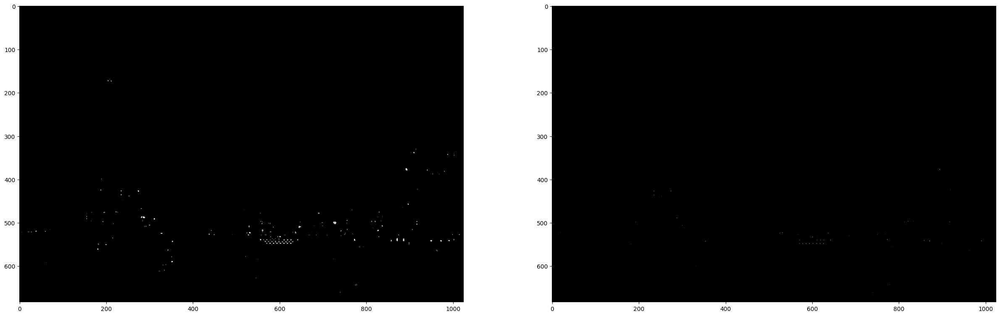

Plotting Corner Image...Done

Implementing SSD...
Implementing SSD...Done

Implementing Patch SSD...


<ipython-input-4-25db2c20704e>:10: RuntimeWarning: overflow encountered in ubyte_scalars
  s = abs(img1[x1,y1] - img2[x2,y2])
<ipython-input-4-25db2c20704e>:42: RuntimeWarning: overflow encountered in ubyte_scalars
  similarity = similarity + (img1_wf[i] - img2_wf[i])**2


Implementing Patch SSD...Done

Implementing Patch NCC...


<ipython-input-4-25db2c20704e>:65: RuntimeWarning: overflow encountered in ubyte_scalars
  numerator = np.sum(img1_wf[i]*img2_wf[i])


Implementing Patch NCC

Rotating Right Image and Applying Gaussian Filter...
Rotating Right Image and Applying Gaussian Filter...Done

Applying NonMax Suppression on all Rotated Images...(This may take some time)
Applying NonMax Suppression on all Rotated Images...Done

Extracting Keypoints from rotated images...
Extracting Keypoints from rotated images...Done

Applying Patch SSD on 45 degree rotated image...
Applying Patch SSD on 45 degree rotated image...Done

Applying Patch SSD on 90 degree rotated image...
Applying Patch SSD on 90 degree rotated image...Done

Applying Patch SSD on 180 degree rotated image...
Applying Patch SSD on 180 degree rotated image...Done


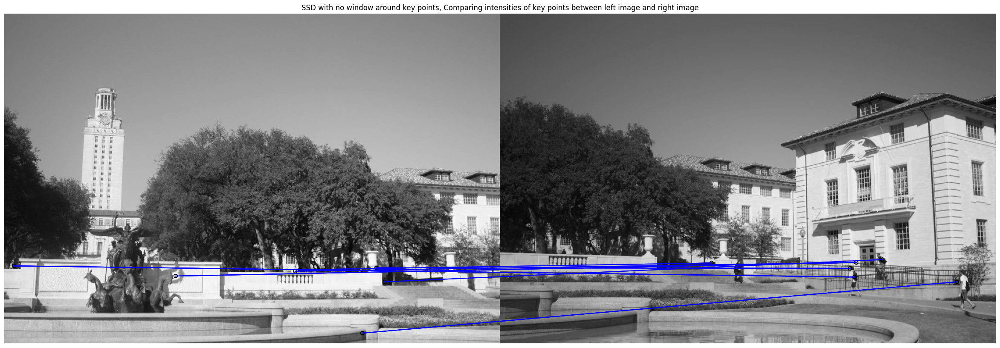

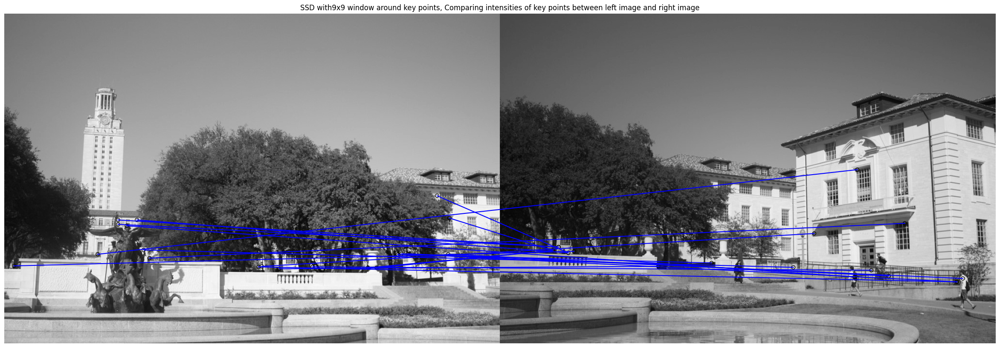

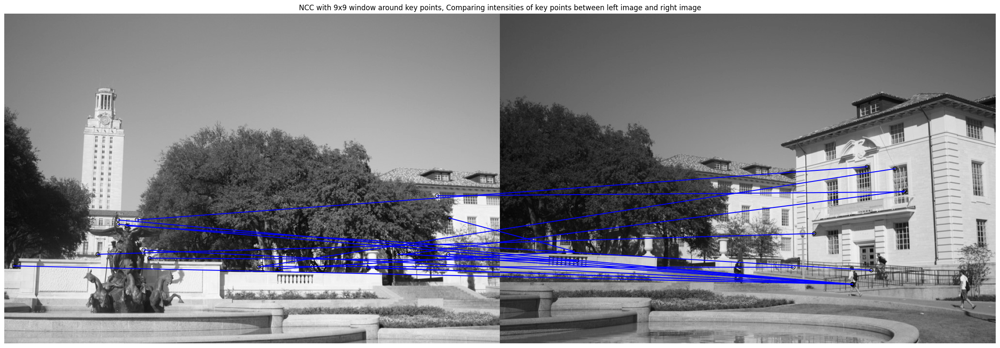

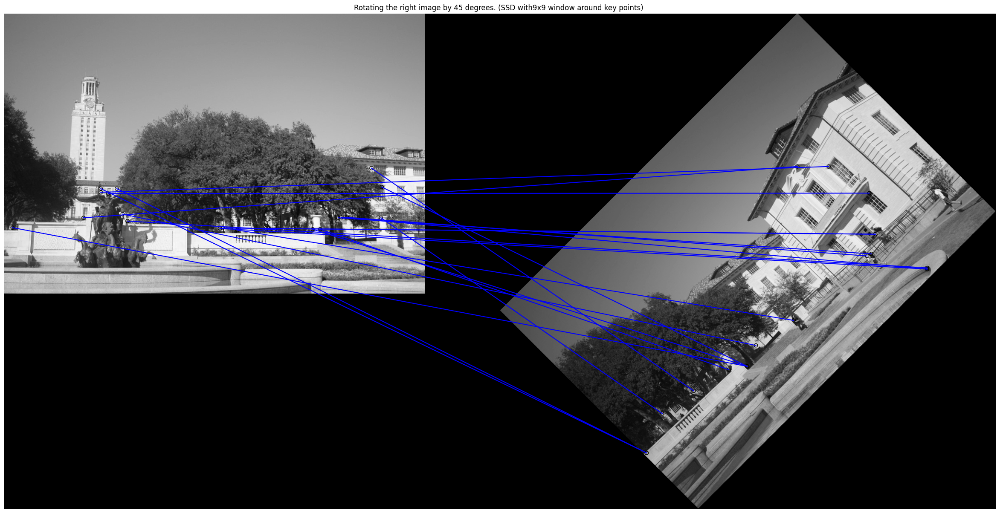

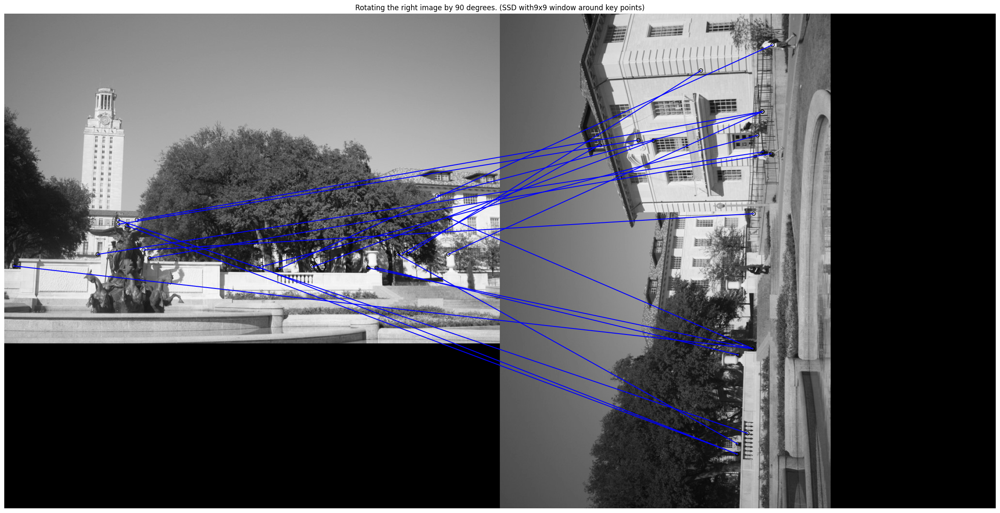

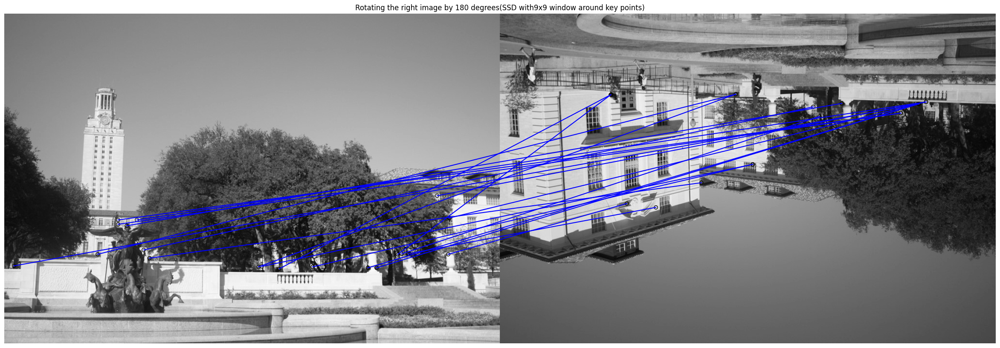

In [6]:
def main():
    # Loading the images and coverting into gray value image
    image1 = cv2.imread("uttower_left.jpg")
    image2 = cv2.imread("uttower_right.jpg")
    img1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # conv2D gaussian filter
    sigma = 1
    print("\nApplying Gaussian Filter on Image...")
    gaussian_filtered_image1 = gaussian_filter(img1, sigma  = sigma)
    gaussian_filtered_image2 = gaussian_filter(img2, sigma = sigma)
    print("Applying Gaussian Filter on Image...Done")

    # Extracing the corner locations
    print("\nFinding corners and performing NonMax Suppression on both the images...")
    final_image1, corner_image1 = NonMaximumSuppression(gaussian_filtered_image1)
    final_image2, corner_image2 = NonMaximumSuppression(gaussian_filtered_image2)
    print("Writing Images to Disk")
    cv2.imwrite('uttowerLeftCorners.jpg', corner_image1)
    cv2.imwrite('uttowerRightCorners.jpg', corner_image2)
    cv2.imwrite('uttowerLeftCornersNMS.jpg', final_image1)
    cv2.imwrite('uttowerRightCornersNMS.jpg', final_image2)
    print("Performing NonMax Suppression...Done")

    # Extracting keypoints
    print("\nExtracting Keypoints...")
    keypoints_img1 = np.argwhere(final_image1>0)
    keypoints_img2 = np.argwhere(final_image2>0)
    print("Extracting Keypoints...Done")
    #print(keypoints_img1)

    # Plotting the corner images
    print("\nPlotting Corner Images...")
    fig = plt.figure(figsize=(30, 100))
    plt.subplot(121), plt.imshow(corner_image1, cmap = 'gray')
    plt.subplot(122), plt.imshow(final_image1, cmap = 'gray')
    plt.show()
    print("Plotting Corner Image...Done")

    # SSD
    print("\nImplementing SSD...")
    sim_list_SSD = SSD(keypoints_img1, img1, keypoints_img2, img2)
    plot(sim_list_SSD, img1, img2, '''SSD with no window around key points, Comparing intensities of key points between left image and right image''')
    print("Implementing SSD...Done")

    # Patch SSD
    print("\nImplementing Patch SSD...")
    sim_list_patch_SSD = patch_SSD(keypoints_img1, img1, keypoints_img2, img2)
    plot(sim_list_patch_SSD[:20], img1, img2, '''SSD with9x9 window around key points, Comparing intensities of key points between left image and right image''')
    print("Implementing Patch SSD...Done")

    # Patch NCC
    print("\nImplementing Patch NCC...")
    sim_list_patch_NCC = patch_NCC(keypoints_img1, img1, keypoints_img2, img2)
    plot(sim_list_patch_NCC[:20], img1, img2, '''NCC with 9x9 window around key points, Comparing intensities of key points between left image and right image''')
    print("Implementing Patch NCC")

    print("\nRotating Right Image and Applying Gaussian Filter...")
    # Rotating the right image
    img2_45 = ndimage.rotate(img2, 45)
    img2_90 = ndimage.rotate(img2, 90)
    img2_180 = ndimage.rotate(img2, 180)


    # conv2D gaussian filter
    gaussian_filtered_image1 = gaussian_filter(img1, sigma = 1)
    gaussian_img2_45 = gaussian_filter(img2_45, sigma = 1)
    gaussian_img2_90 = gaussian_filter(img2_90, sigma = 1)
    gaussian_img2_180 = gaussian_filter(img2_180,sigma = 1)
    print("Rotating Right Image and Applying Gaussian Filter...Done")

    # Extracing the corner locations
    #final_image1, corner_image1 = NonMaximumSuppression(gaussian_filtered_image1)
    print("\nApplying NonMax Suppression on all Rotated Images...(This may take some time)")
    final_image2_45, corner_image2_45 = NonMaximumSuppression(gaussian_img2_45)
    final_image2_90, corner_image2_90 = NonMaximumSuppression(gaussian_img2_90)
    final_image2_180, corner_image2_180 = NonMaximumSuppression(gaussian_img2_180)
    print("Applying NonMax Suppression on all Rotated Images...Done")

    # Extracting keypoints
    print("\nExtracting Keypoints from rotated images...")
    keypoints_img1 = np.argwhere(final_image1>0)
    keypoints_img2_45 = np.argwhere(final_image2_45>0)
    keypoints_img2_90 = np.argwhere(final_image2_90>0)
    keypoints_img2_180 = np.argwhere(final_image2_180>0)
    print("Extracting Keypoints from rotated images...Done")

    # Using Patch SSD on 45 degree rotated image
    print("\nApplying Patch SSD on 45 degree rotated image...")
    sim_list_patch_SSD_45 = patch_SSD(keypoints_img1, img1, keypoints_img2_45, img2_45)
    plot(sim_list_patch_SSD_45[:20], img1, img2_45, '''Rotating the right image by 45 degrees. (SSD with9x9 window around key points) ''')
    print("Applying Patch SSD on 45 degree rotated image...Done")

    # Using Patch SSD on 90 degree rotated image
    print("\nApplying Patch SSD on 90 degree rotated image...")
    sim_list_patch_SSD_90 = patch_SSD(keypoints_img1, img1, keypoints_img2_90, img2_90)
    plot(sim_list_patch_SSD_90[:20], img1, img2_90, '''Rotating the right image by 90 degrees. (SSD with9x9 window around key points)''')
    print("Applying Patch SSD on 90 degree rotated image...Done")

    # Using Patch SSD on 180 degree rotated image
    print("\nApplying Patch SSD on 180 degree rotated image...")
    sim_list_patch_SSD_180 = patch_SSD(keypoints_img1, img1, keypoints_img2_180, img2_180)
    plot(sim_list_patch_SSD_180[:20], img1, img2_180, '''Rotating the right image by 180 degrees(SSD with9x9 window around key points)''')
    print("Applying Patch SSD on 180 degree rotated image...Done")
main()